# Assignment 1 for ecse415 - Computer Vision

In [48]:
# Imports
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive
import math

# used drive.mount to get other files
drive.mount('/content/drive') 
###CHange this variable to path to images
pathVariable = '/content/drive/MyDrive/ecse415/images/'

True
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#Question 1 - Thesholding

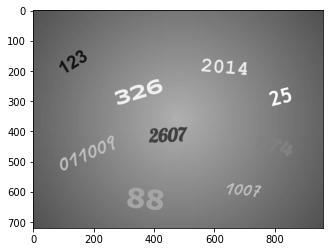

In [27]:
numbers_arr = cv2.imread(pathVariable + 'numbers.jpg', cv2.IMREAD_GRAYSCALE)
plt.imshow(numbers_arr, cmap='gray')


## Q1.1

(Text(0.5, 1.0, 'Threshold > 200'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

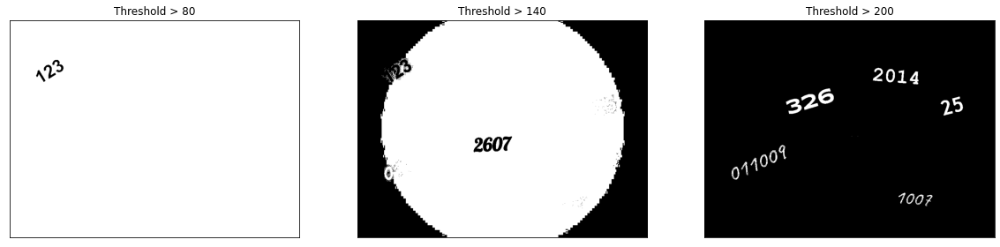

In [28]:
# np.where keeps np elements that meet the conditon and sets them to either 0 or 255 depending on if condition met
# there are three conditions for thid question
first_threshold = np.where(numbers_arr > 80, 255, 0)
second_threshold = np.where(numbers_arr > 140, 255, 0)
third_threshold = np.where(numbers_arr > 200, 255, 0)

plt.figure(figsize=(20, 20))
plt.subplot(131), plt.imshow(first_threshold, cmap="gray")
plt.title("Threshold > 80"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(second_threshold, cmap="gray")
plt.title("Threshold > 140"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(third_threshold, cmap="gray")
plt.title("Threshold > 200"), plt.xticks([]), plt.yticks([])

## Q1.2

Thresholded images at different thresholds will retain different elements. There are many different values of pixels, and therefore the higher the theshold becomes, the numbers that are darker at the beginning remain visible in the smaller range since the background remains white, and the numbers stay dark. But as the theshold increaes, the the light numbers stay white and visible and the background becomes dark.
The visible numbers at each theshold:
>80 : 123

>140 : 2607

>200 : 011009, 326, 2014, 25, 1007 

# Q1.3

Obersvations:

This question is opposite of first part. Between 60 and 110, the darker numbers turn white and bacgkround becomes black. Between 150 and 60, the inner circle becomes black but the outer part is white. Between 150 and 90 is similar in background to 150 and 60, but now the number 123 is visible, indicating it probably has a value between 60 and 90.

Visible numbers for each picture:

110 >Theshold> 60 : 123, 2607

150 > Theshold > 60: 2607

150 > Theshold > 90: 2607, 123

(Text(0.5, 1.0, '150 > Threshold > 90'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

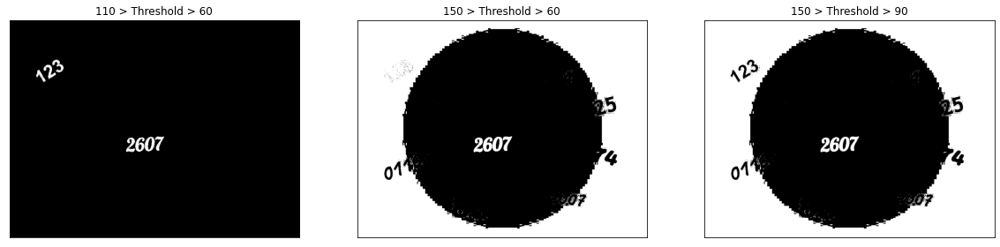

In [29]:
first_window_threshold = np.where(((numbers_arr < 110 ) & (numbers_arr > 60)),255,0)
second_window_threshold = np.where(((numbers_arr < 150 ) & (numbers_arr > 60)),255,0)
third_window_threshold = np.where(((numbers_arr < 150 ) & (numbers_arr > 90)),255,0)

plt.figure(figsize=(20, 20))
plt.subplot(131), plt.imshow(first_window_threshold, cmap="gray")
plt.title("110 > Threshold > 60"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(second_window_threshold, cmap="gray")
plt.title("150 > Threshold > 60"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(third_window_threshold, cmap="gray")
plt.title("150 > Threshold > 90"), plt.xticks([]), plt.yticks([])

# Q1.4

I knew that the values had to be above 90 from the previous question, because it would display 123 so i used this as my starting point. Then I knew that to make the background completely white, that it would have to be less than 200, from question. Then I just kept increasing that larger theshold until I got the numbers I wanted to keep. 

(Text(0.5, 1.0, '230 > Threshold > 90'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

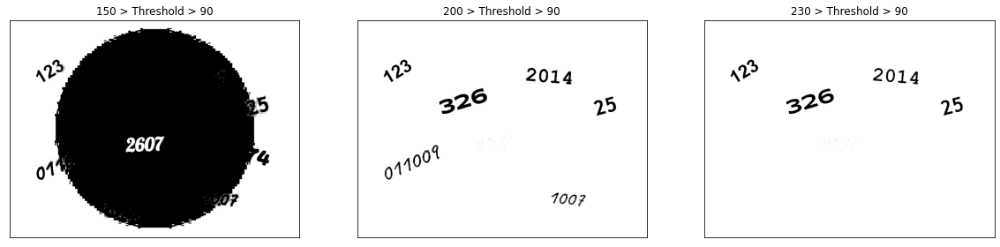

In [30]:
test_window_threshold_1 = np.where(((numbers_arr < 150 ) & (numbers_arr > 90)),255,0)
test_window_threshold_2 = np.where(((numbers_arr < 200 ) & (numbers_arr > 90)),255,0)
test_window_threshold_3 = np.where(((numbers_arr < 230 ) & (numbers_arr > 90)),255,0)

plt.figure(figsize=(20, 20))
plt.subplot(131), plt.imshow(test_window_threshold_1, cmap="gray")
plt.title("150 > Threshold > 90"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(test_window_threshold_2, cmap="gray")
plt.title("200 > Threshold > 90"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(test_window_threshold_3, cmap="gray")
plt.title("230 > Threshold > 90"), plt.xticks([]), plt.yticks([])

# Question 2 - Denoising

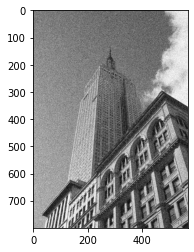

In [31]:
tower_img = cv2.imread(pathVariable + 'Tower_Gauss_Noise.png', cv2.IMREAD_GRAYSCALE)
plt.imshow(tower_img, cmap='gray')


## Q2.1

(Text(0.5, 1.0, 'Gaussian Filtered'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

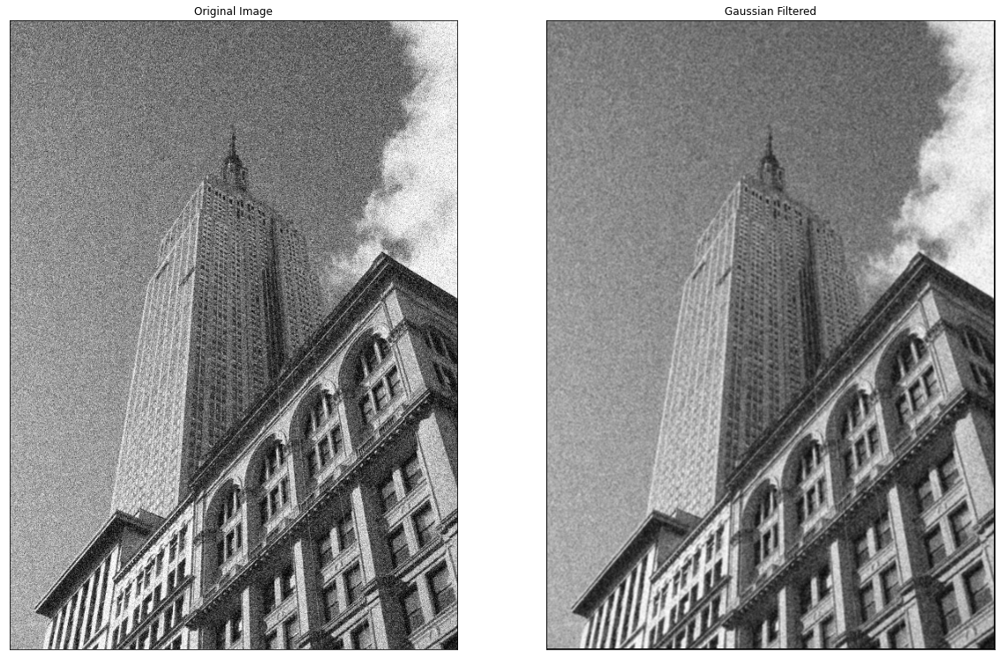

In [32]:
# use cv2 to calculate gaussian and then convert it to 2D array
# size 3 kernel and sigma = squareroot(2) because the variance is 2
gsKernel = cv2.getGaussianKernel(ksize=3,sigma=math.sqrt(2))
gsKernel = gsKernel * gsKernel.transpose(1, 0)
# normalize kernel so that sum is 1
gsKernel = gsKernel / np.sum(gsKernel)
# box kernel of size 3. all elements equal weight
boxKernel = np.full((3, 3), 1/9)

# calcute value of element by multiplying submatrix by kernel and returning the sum
def calc_val(arr,kernel):
  copy = arr*kernel
  return np.sum(copy)

# take the image as input and the kernel and apply the filter to the image
def filter_image(image,kernel):
  # create copy array of equal size and initialize all zeros
  output = np.zeros((image.shape[0],image.shape[1]))
  image_height = image.shape[0]
  image_width = image.shape[1]
  # go through each element, but start at index row 1 and end at row height-1
  # and start at column 1 and end at column  width -1. This is because we keep a 0 padding on the edges
  # then calculate the new filtered value of the element 
  for row in range(1,image_height-1):
    for column in range(1,image_width-1):
      piece = image[row-1:row+2,column-1:column+2]
      val = calc_val(piece,kernel)
      output[row][column] = val

  return output

# apply the gaussian filter kernel on the tower image and then display it 
gaussianOutput = filter_image(tower_img,gsKernel)

plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(tower_img, cmap="gray")
plt.title("Original Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(gaussianOutput, cmap="gray")
plt.title("Gaussian Filtered"), plt.xticks([]), plt.yticks([])

## Q2.2

(Text(0.5, 1.0, 'Box Filtered'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

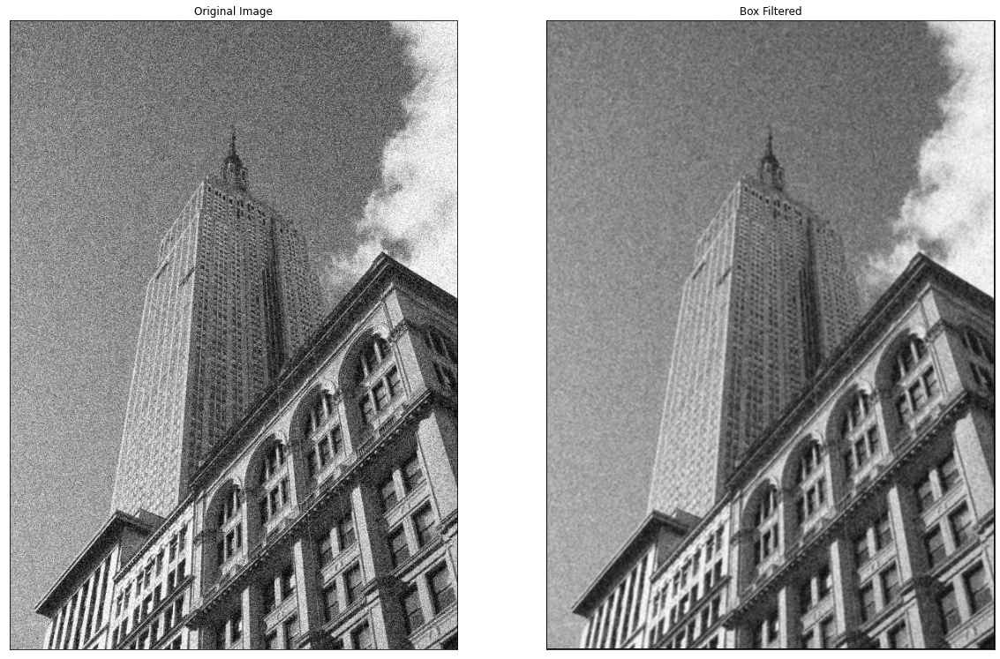

In [33]:
# apply the box filter kernel on the tower image and then display it 

boxOutput = filter_image(tower_img,boxKernel)

plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(tower_img, cmap="gray")
plt.title("Original Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(boxOutput, cmap="gray")
plt.title("Box Filtered"), plt.xticks([]), plt.yticks([])

## Q2.3

The Gaussian filter gives higher PSNR value thereofre better

In [34]:
clean_tower = cv2.imread(pathVariable + 'Tower.png', cv2.IMREAD_GRAYSCALE).astype(np.float64)
# convert everything back to np.float64. they changed during computation
tower_img = tower_img.astype(np.float64)
gaussianOutput = gaussianOutput.astype(np.float64)
boxOutput = boxOutput.astype(np.float64)

# use cv2 provided PSNR function calculator and then print the values
gaussianPSNR = cv2.PSNR(clean_tower,gaussianOutput)
boxPSNR = cv2.PSNR(clean_tower, boxOutput)

print("Gaussian PSNR: {}".format(gaussianPSNR))
print("Box PSNR: {}".format(boxPSNR))


Gaussian PSNR: 22.73524710624808
Box PSNR: 22.57850703234447


## Q2.4

(Text(0.5, 1.0, 'Gaussian Filtered Filtered'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

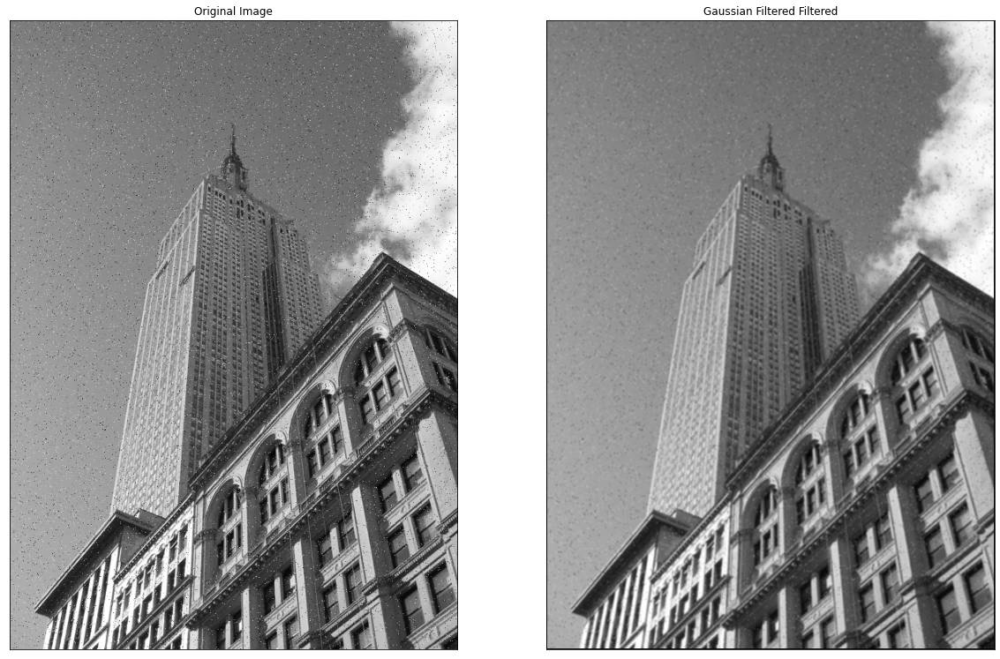

In [35]:
salt_n_pepper_img = cv2.imread(pathVariable + 'Tower_Salt_and_Pepper_Noise.png', cv2.IMREAD_GRAYSCALE)

salt_n_pepper_gaus_filter = filter_image(salt_n_pepper_img,gsKernel)

plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(salt_n_pepper_img, cmap="gray")
plt.title("Original Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(salt_n_pepper_gaus_filter, cmap="gray")
plt.title("Gaussian Filtered Filtered"), plt.xticks([]), plt.yticks([])

## Q2.5



(Text(0.5, 1.0, 'Median Filtered Image'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

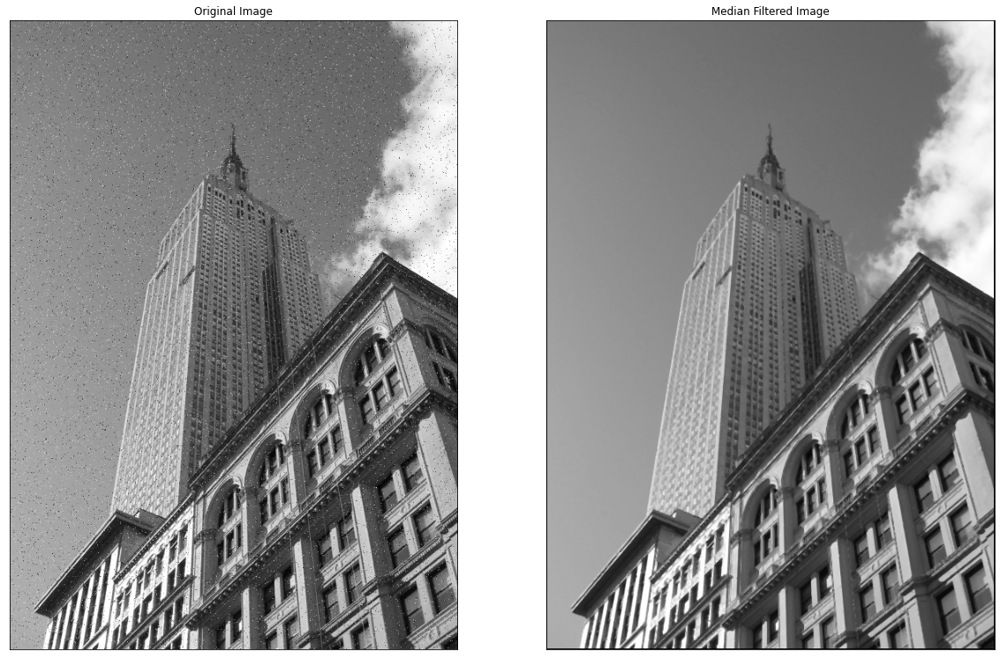

In [36]:
# median filter, takes in the image and for each pixel
def filter_image_median(image):
  # create copy with zeros of same size
  output = np.zeros((image.shape[0],image.shape[1]))
  image_height = image.shape[0]
  image_width = image.shape[1]
  # go through each element, but start at index row 1 and end at row height-1
  # and start at column 1 and end at column  width -1. This is because we keep a 0 padding on the edges
  # then calculate the new filtered value of the element by taking the median value of the 
  # sub 3x3 array
  for row in range(1,image_height-1):
    for column in range(1,image_width-1):
      piece = image[row-1:row+2,column-1:column+2]
      val = np.median(piece)
      output[row][column] = val
  return output

salt_n_pepper_median_filter = filter_image_median(salt_n_pepper_img)

plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(salt_n_pepper_img, cmap="gray")
plt.title("Original Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(salt_n_pepper_median_filter, cmap="gray")
plt.title("Median Filtered Image"), plt.xticks([]), plt.yticks([])

### Q2.6

Gaussing PSNR value is higher therefore is better.


In [37]:

salt_n_pepper_img = salt_n_pepper_img.astype(np.float64)
salt_n_pepper_gaus_filter = salt_n_pepper_gaus_filter.astype(np.float64)
salt_n_pepper_median_filter = salt_n_pepper_median_filter.astype(np.float64)


gaussPSNR = cv2.PSNR(salt_n_pepper_gaus_filter,salt_n_pepper_img)
medianPSNR = cv2.PSNR(salt_n_pepper_median_filter,salt_n_pepper_img)

print("Gaus PSNR: {}".format(gaussPSNR))
print("Median PSNR: {}".format(medianPSNR))


Gaus PSNR: 21.894747261060843
Median PSNR: 21.793698132654256


# Question 3 - Sobel Edge Detector

## Q3.1

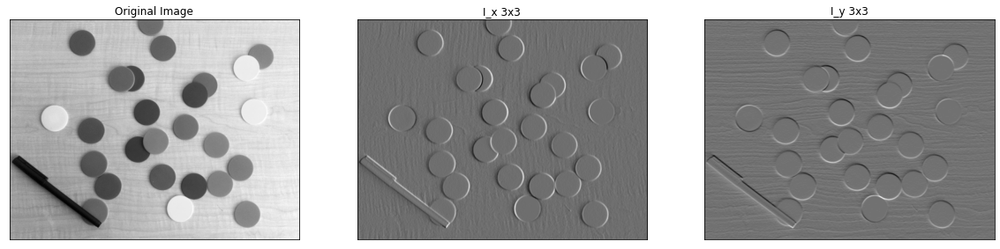

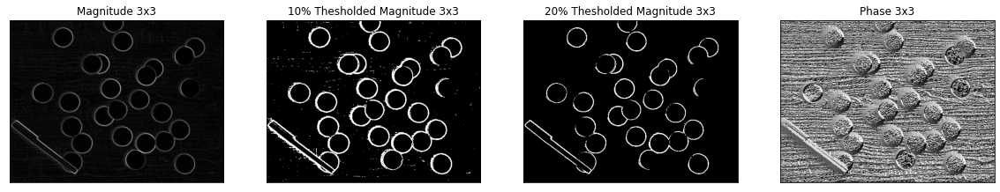

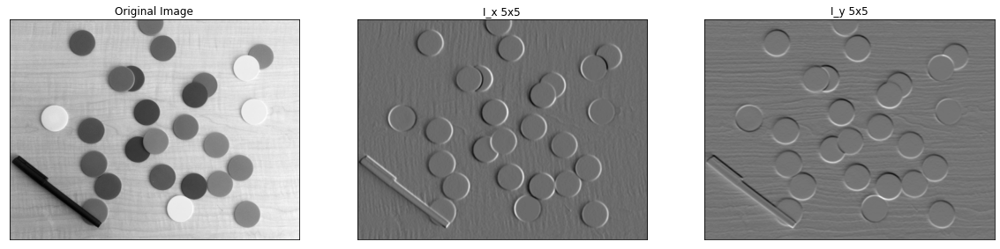

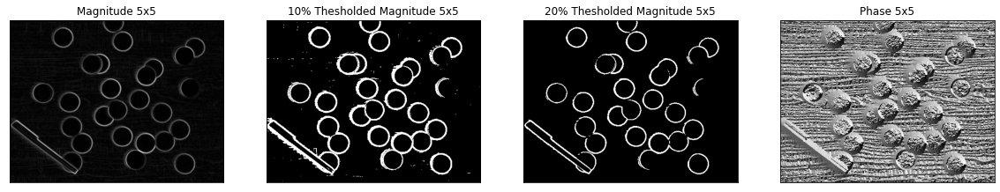

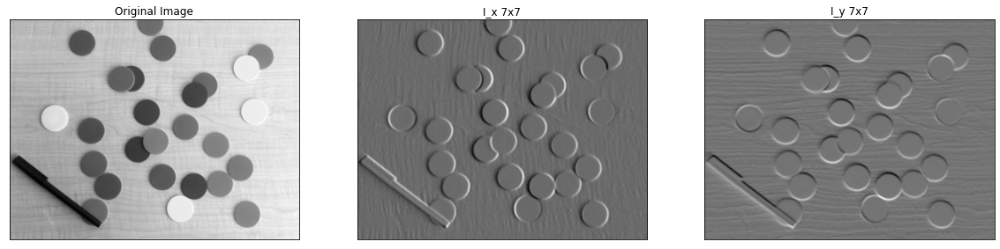

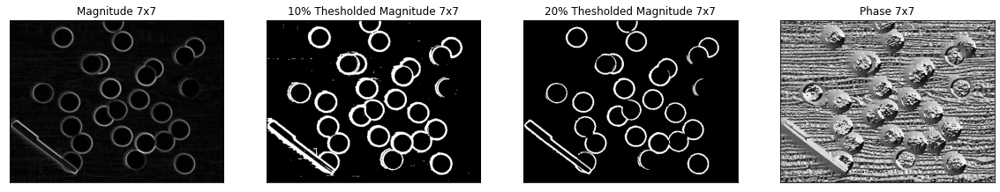

In [38]:
def threshold(img, thresholdRatio):
  threshold = img.max() * thresholdRatio;
  res = np.zeros_like(img)
  res[img>=threshold] = np.int32(255)
  res[img<threshold] = np.int32(0)
  return res




circle_img = cv2.imread(pathVariable + "Circles.png", cv2.IMREAD_GRAYSCALE)

# apply 3x3 Sobel filters to the intensity channel
I_x_three = cv2.Sobel(circle_img, cv2.CV_64F, 1, 0, ksize=3)
I_y_three = cv2.Sobel(circle_img, cv2.CV_64F, 0, 1, ksize=3)
# compute sobel Magnitude/Phase
I_m_three = cv2.magnitude(I_x_three, I_y_three)
I_p_three = cv2.phase(I_x_three, I_y_three)

thesholded_img_three_low = threshold(I_m_three,thresholdRatio=0.1)
thesholded_img_three_high = threshold(I_m_three,thresholdRatio=0.2)


# display images
plt.figure(figsize=(20, 20))
plt.subplot(131), plt.imshow(circle_img, cmap="gray")
plt.title("Original Image"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(I_x_three, cmap="gray")
plt.title("I_x 3x3"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(I_y_three, cmap="gray")
plt.title("I_y 3x3"), plt.xticks([]), plt.yticks([])

plt.figure(figsize=(20, 20))
plt.subplot(141), plt.imshow(I_m_three, cmap="gray")
plt.title("Magnitude 3x3"), plt.xticks([]), plt.yticks([])
plt.subplot(142), plt.imshow(thesholded_img_three_low, cmap="gray")
plt.title("10% Thesholded Magnitude 3x3"), plt.xticks([]), plt.yticks([])
plt.subplot(143), plt.imshow(thesholded_img_three_high, cmap="gray")
plt.title("20% Thesholded Magnitude 3x3"), plt.xticks([]), plt.yticks([])
plt.subplot(144), plt.imshow(I_p_three, cmap="gray")
plt.title("Phase 3x3"), plt.xticks([]), plt.yticks([])
plt.show()

#############################################
#############################################

# apply 5x5 Sobel filters to the intensity channel
I_x_five = cv2.Sobel(circle_img, cv2.CV_64F, 1, 0, ksize=5)
I_y_five = cv2.Sobel(circle_img, cv2.CV_64F, 0, 1, ksize=5)
# compute sobel Magnitude/Phase
I_m_five = cv2.magnitude(I_x_five, I_y_five)
I_p_five = cv2.phase(I_x_five, I_y_five)

thesholded_img_five_low = threshold(I_m_five,thresholdRatio=0.1)
thesholded_img_five_high = threshold(I_m_five,thresholdRatio=0.2)


# display images
plt.figure(figsize=(20, 20))
plt.subplot(131), plt.imshow(circle_img, cmap="gray")
plt.title("Original Image"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(I_x_five, cmap="gray")
plt.title("I_x 5x5"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(I_y_five, cmap="gray")
plt.title("I_y 5x5"), plt.xticks([]), plt.yticks([])

plt.figure(figsize=(20, 20))
plt.subplot(141), plt.imshow(I_m_five, cmap="gray")
plt.title("Magnitude 5x5"), plt.xticks([]), plt.yticks([])
plt.subplot(142), plt.imshow(thesholded_img_five_low, cmap="gray")
plt.title("10% Thesholded Magnitude 5x5"), plt.xticks([]), plt.yticks([])
plt.subplot(143), plt.imshow(thesholded_img_five_high, cmap="gray")
plt.title("20% Thesholded Magnitude 5x5"), plt.xticks([]), plt.yticks([])
plt.subplot(144), plt.imshow(I_p_five, cmap="gray")
plt.title("Phase 5x5"), plt.xticks([]), plt.yticks([])
plt.show()

############################################
############################################
############################################

# apply 7x7 Sobel filters to the intensity channel
I_x_seven = cv2.Sobel(circle_img, cv2.CV_64F, 1, 0, ksize=7)
I_y_seven = cv2.Sobel(circle_img, cv2.CV_64F, 0, 1, ksize=7)
# compute sobel Magnitude/Phase
I_m_seven = cv2.magnitude(I_x_seven, I_y_seven)
I_p_seven = cv2.phase(I_x_seven, I_y_seven)

thesholded_img_seven_low = threshold(I_m_seven,thresholdRatio=0.1)
thesholded_img_seven_high = threshold(I_m_seven,thresholdRatio=0.2)


# display images
plt.figure(figsize=(20, 20))
plt.subplot(131), plt.imshow(circle_img, cmap="gray")
plt.title("Original Image"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(I_x_seven, cmap="gray")
plt.title("I_x 7x7"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(I_y_seven, cmap="gray")
plt.title("I_y 7x7"), plt.xticks([]), plt.yticks([])

plt.figure(figsize=(20, 20))
plt.subplot(141), plt.imshow(I_m_seven, cmap="gray")
plt.title("Magnitude 7x7"), plt.xticks([]), plt.yticks([])
plt.subplot(142), plt.imshow(thesholded_img_seven_low, cmap="gray")
plt.title("10% Thesholded Magnitude 7x7"), plt.xticks([]), plt.yticks([])
plt.subplot(143), plt.imshow(thesholded_img_seven_high, cmap="gray")
plt.title("20% Thesholded Magnitude 7x7"), plt.xticks([]), plt.yticks([])
plt.subplot(144), plt.imshow(I_p_seven, cmap="gray")
plt.title("Phase 7x7"), plt.xticks([]), plt.yticks([])
plt.show()

### Q3.2 
The larger the kernel size, the larger the edges are and the blurrier the image becomes.


## Q3.3

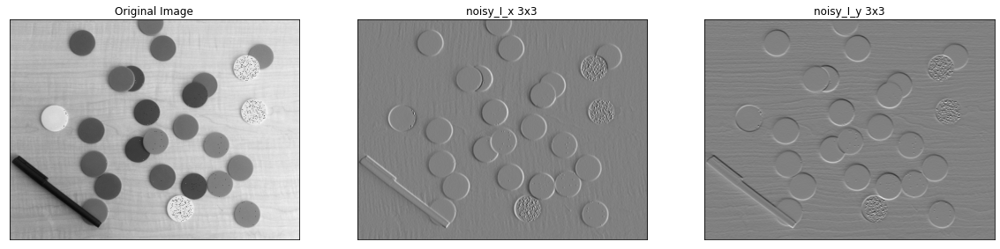

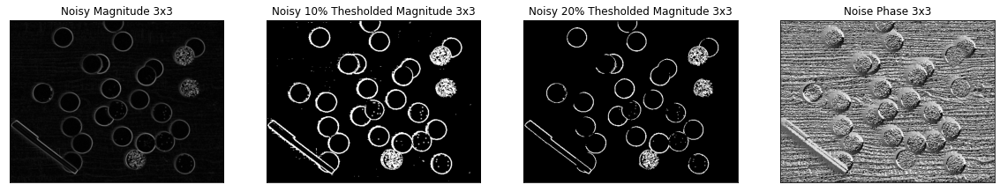

In [39]:
noisy_circle_img = cv2.imread(pathVariable + "Circles_gauss.png", cv2.IMREAD_GRAYSCALE)

# apply 3x3 Sobel filters to the intensity channel
noisy_I_x_three = cv2.Sobel(noisy_circle_img, cv2.CV_64F, 1, 0, ksize=3)
noisy_I_y_three = cv2.Sobel(noisy_circle_img, cv2.CV_64F, 0, 1, ksize=3)
# compute sobel Magnitude/Phase
noisy_I_m_three = cv2.magnitude(noisy_I_x_three, noisy_I_y_three)
noisy_I_p_three = cv2.phase(noisy_I_x_three, noisy_I_y_three)

noisy_thesholded_img_three_low = threshold(noisy_I_m_three,thresholdRatio=0.1)
noisy_thesholded_img_three_high = threshold(noisy_I_m_three,thresholdRatio=0.2)


# display images
plt.figure(figsize=(20, 20))
plt.subplot(131), plt.imshow(noisy_circle_img, cmap="gray")
plt.title("Original Image"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(noisy_I_x_three, cmap="gray")
plt.title("noisy_I_x 3x3"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(noisy_I_y_three, cmap="gray")
plt.title("noisy_I_y 3x3"), plt.xticks([]), plt.yticks([])

plt.figure(figsize=(20, 20))
plt.subplot(141), plt.imshow(noisy_I_m_three, cmap="gray")
plt.title("Noisy Magnitude 3x3"), plt.xticks([]), plt.yticks([])
plt.subplot(142), plt.imshow(noisy_thesholded_img_three_low, cmap="gray")
plt.title("Noisy 10% Thesholded Magnitude 3x3"), plt.xticks([]), plt.yticks([])
plt.subplot(143), plt.imshow(noisy_thesholded_img_three_high, cmap="gray")
plt.title("Noisy 20% Thesholded Magnitude 3x3"), plt.xticks([]), plt.yticks([])
plt.subplot(144), plt.imshow(noisy_I_p_three, cmap="gray")
plt.title("Noise Phase 3x3"), plt.xticks([]), plt.yticks([])
plt.show()

## Q3.4

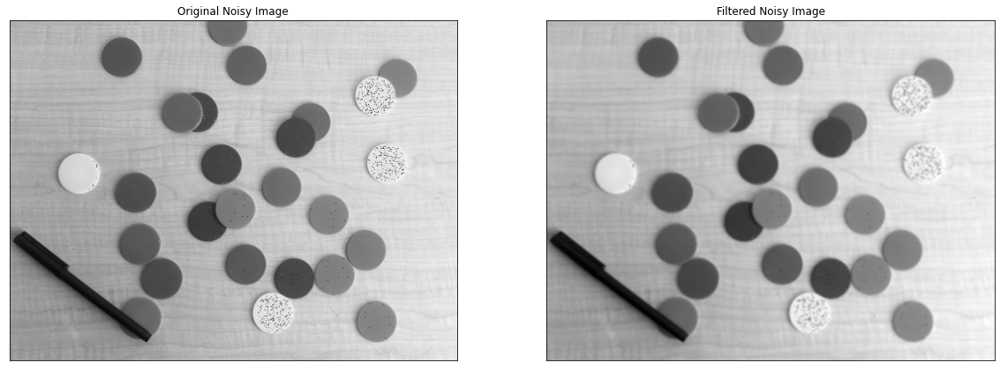

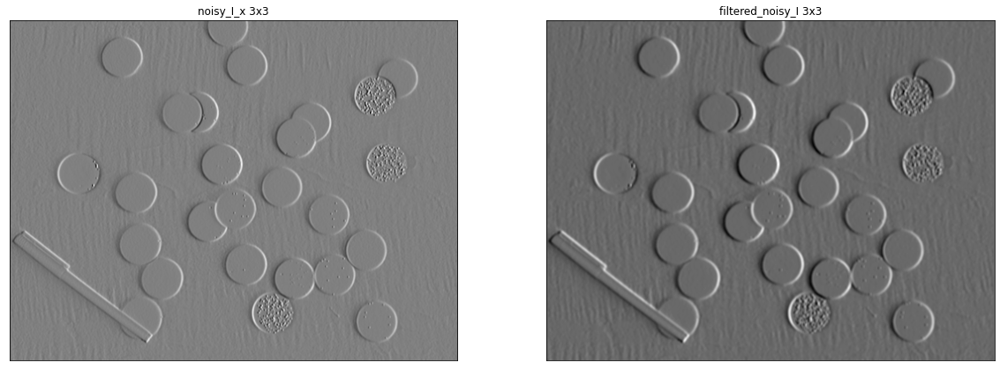

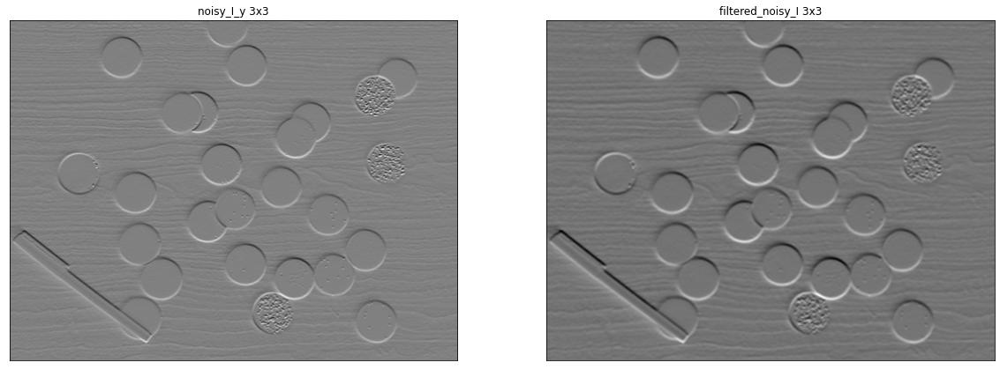

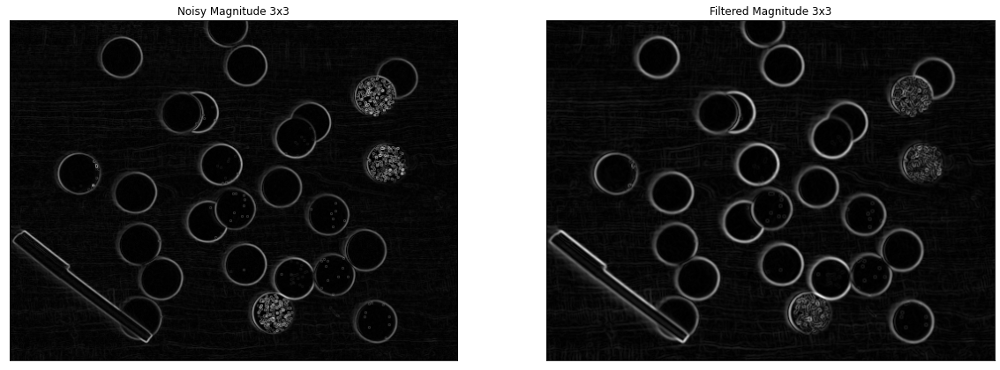

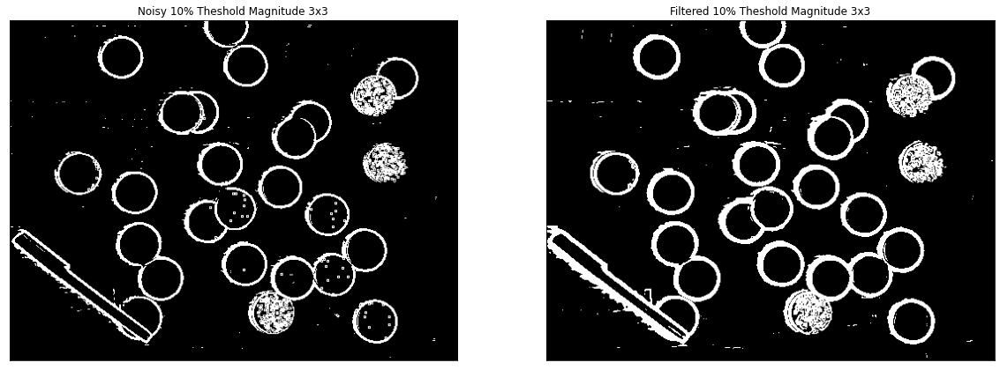

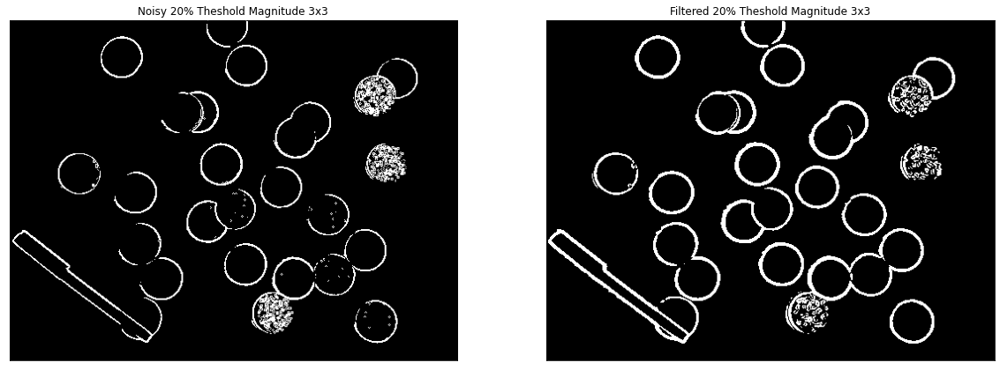

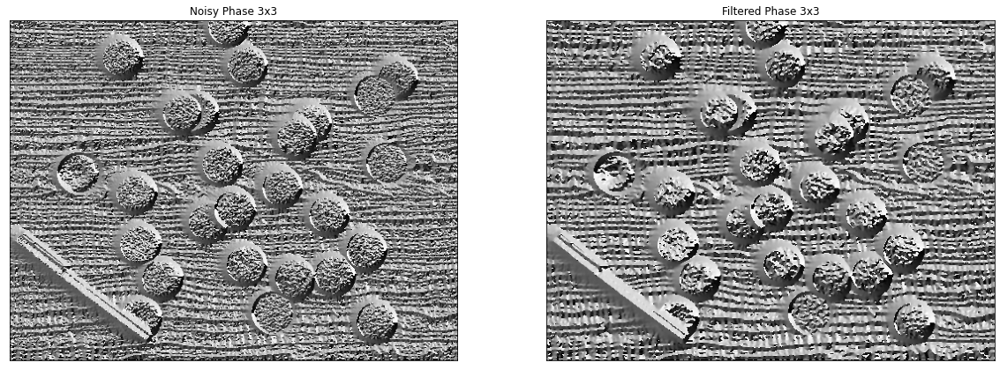

In [40]:
# create box filter 3x3
box_filter = (1/9)*np.array([[1,1,1],[1,1,1],[1,1,1]])

#filter image with box_filter from cv2 library
filtered_image = cv2.filter2D(noisy_circle_img, cv2.CV_64F, box_filter)


# apply 3x3 Sobel filters to the intensity channel
filtered_noisy_I_x_three = cv2.Sobel(filtered_image, cv2.CV_64F, 1, 0, ksize=3)
filtered_noisy_I_y_three = cv2.Sobel(filtered_image, cv2.CV_64F, 0, 1, ksize=3)
# compute sobel Magnitude/Phase
filtered_noisy_I_m_three = cv2.magnitude(filtered_noisy_I_x_three, filtered_noisy_I_y_three)
filtered_noisy_I_p_three = cv2.phase(filtered_noisy_I_x_three, filtered_noisy_I_y_three)

filtered_noisy_thesholded_img_three_low = threshold(filtered_noisy_I_m_three,thresholdRatio=0.1)
filtered_noisy_thesholded_img_three_high = threshold(filtered_noisy_I_m_three,thresholdRatio=0.2)


# display images
plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(noisy_circle_img, cmap="gray")
plt.title("Original Noisy Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(filtered_image, cmap="gray")
plt.title("Filtered Noisy Image"), plt.xticks([]), plt.yticks([])

plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(noisy_I_x_three, cmap="gray")
plt.title("noisy_I_x 3x3"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(filtered_noisy_I_x_three, cmap="gray")
plt.title("filtered_noisy_I 3x3"), plt.xticks([]), plt.yticks([])

plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(noisy_I_y_three, cmap="gray")
plt.title("noisy_I_y 3x3"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(filtered_noisy_I_y_three, cmap="gray")
plt.title("filtered_noisy_I 3x3"), plt.xticks([]), plt.yticks([])

plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(noisy_I_m_three, cmap="gray")
plt.title("Noisy Magnitude 3x3"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(filtered_noisy_I_m_three, cmap="gray")
plt.title("Filtered Magnitude 3x3"), plt.xticks([]), plt.yticks([])

plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(noisy_thesholded_img_three_low, cmap="gray")
plt.title("Noisy 10% Theshold Magnitude 3x3"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(filtered_noisy_thesholded_img_three_low, cmap="gray")
plt.title("Filtered 10% Theshold Magnitude 3x3"), plt.xticks([]), plt.yticks([])

plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(noisy_thesholded_img_three_high, cmap="gray")
plt.title("Noisy 20% Theshold Magnitude 3x3"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(filtered_noisy_thesholded_img_three_high, cmap="gray")
plt.title("Filtered 20% Theshold Magnitude 3x3"), plt.xticks([]), plt.yticks([])


plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(noisy_I_p_three, cmap="gray")
plt.title("Noisy Phase 3x3"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(filtered_noisy_I_p_three, cmap="gray")
plt.title("Filtered Phase 3x3"), plt.xticks([]), plt.yticks([])
plt.show()

## Q3.5
Denoising prior to edge detection is a very effective tool if there is not too much noise in thsat region. As you can see, there are some circles that experience a bit of noise, and the edges are more faint in the noisy image than in the denoised image. However, some circles are very noisy and it is hard to get rid of the noise completely and therefore edges are not much better than original.